In [1]:
#GENERAL
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import random

#PATH PROCESS
import os
from pathlib import Path
import glob

#IMAGE PROCESS
from PIL import Image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from keras.applications.vgg16 import preprocess_input, decode_predictions
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from scipy.ndimage import convolve
from skimage import data, io, filters

#SCALER & TRANSFORMATION
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from keras import regularizers

#ACCURACY CONTROL
from sklearn.metrics import (
    confusion_matrix, accuracy_score, classification_report, 
    roc_auc_score, roc_curve, mean_squared_error, r2_score
)
from sklearn.model_selection import GridSearchCV, cross_val_score

#OPTIMIZER
from keras.optimizers import RMSprop, Adam, SGD

#MODEL LAYERS
from tensorflow.keras.models import Sequential
from keras.layers import (
    Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization, 
    Permute, TimeDistributed, Bidirectional, GRU, SimpleRNN, LSTM, 
    GlobalAveragePooling2D, SeparableConv2D, ZeroPadding2D, 
    AveragePooling2D, Input, GlobalMaxPooling2D, Conv2DTranspose, Reshape
)
from keras.models import Model, load_model
from keras.regularizers import l1, l2, L1L2
from tensorflow.keras import regularizers
from keras.applications import VGG16, VGG19, inception_v3
from keras.utils import plot_model
from keras import backend as K

# WARNINGS FILTER
from warnings import filterwarnings
filterwarnings("ignore", category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning)
filterwarnings("ignore", category=UserWarning)


# PATH, LABEL, TRANSFORMATION FOR SUPERVISED

#### MAIN CSV

In [5]:
Mars_Train_CSV = pd.read_csv(r"D:\Intern\Mars New\Mars Surface and Curiosity Image\Train_CSV.csv")
Mars_Test_CSV = pd.read_csv(r"D:\Intern\Mars New\Mars Surface and Curiosity Image\Test_CSV.csv")
Mars_Validation_CSV = pd.read_csv(r"D:\Intern\Mars New\Mars Surface and Curiosity Image\Validation_CSV.csv")

In [7]:
print(Mars_Train_CSV.head(-1))

                                                JPG  LABELS
0     calibrated/0077ML0005780000102730I01_DRCL.JPG      15
1     calibrated/0072MR0005610170103642E01_DRCL.JPG       8
2     calibrated/0069MR0004130000103477I01_DRCL.JPG      21
3     calibrated/0154ML0008510010104492E01_DRCL.JPG       8
4     calibrated/0019MR0000530000100138C00_DRCL.JPG       8
...                                             ...     ...
3740  calibrated/0078MR0005760370103872E01_DRCL.JPG       8
3741  calibrated/0163ML0008760050104602D01_DRCL.JPG      10
3742  calibrated/0072MR0005620000103655E01_DRCL.JPG       8
3743  calibrated/0066ML0003650000102517M00_DRCL.JPG      21
3744  calibrated/0157ML0008550020104531I01_DRCL.JPG       8

[3745 rows x 2 columns]


In [9]:
print(Mars_Test_CSV.head(-1))

                                                JPG  LABELS
0     calibrated/0830MR0036510000500684E01_DRCL.JPG       7
1     calibrated/0640MH0002640000203781I01_DRCL.JPG      24
2     calibrated/0647MH0003250050203806E01_DRCL.JPG       9
3     calibrated/0844MR0037590000501001I01_DRCL.JPG       7
4     calibrated/0618MR0026460020401253I01_DRCL.JPG      11
...                                             ...     ...
1299  calibrated/0894MR0039190000501251E01_DRCL.JPG       0
1300  calibrated/0571MH0002590000201894I01_DRCL.JPG      24
1301  calibrated/0840ML0037090000401385I01_DRCL.JPG      17
1302  calibrated/0868MH0003900000302200I01_DRCL.JPG      10
1303  calibrated/0568MH0002630000201882E01_DRCL.JPG      24

[1304 rows x 2 columns]


In [11]:
print(Mars_Validation_CSV.head(-1))

                                                JPG  LABELS
0     calibrated/0292MH0002810020103587C00_DRCL.JPG       5
1     calibrated/0270MH0002530050102760I01_DRCL.JPG       5
2     calibrated/0549MH0002620000201566E01_DRCL.JPG      24
3     calibrated/0229MR0009720000202913E01_DRCL.JPG       0
4     calibrated/0292MH0002810020103613C00_DRCL.JPG       5
...                                             ...     ...
1634  calibrated/0283MH0002730050103243I01_DRCL.JPG       5
1635  calibrated/0486MR0011580000302944E01_DRCL.JPG       0
1636  calibrated/0506MH0002240020200655I01_DRCL.JPG       8
1637  calibrated/0229MR0010840000202939I01_DRCL.JPG      16
1638  calibrated/0229MR0009760000202918I01_DRCL.JPG      18

[1639 rows x 2 columns]


#### NEW PATH PROCESS

In [14]:
def new_path_function(jpg_path,jpg_labels,new_jpg_list,new_label_list,splitting_string = "calibrated"):
    
    for image_path, path_label in zip(jpg_path,jpg_labels):
        ID_pathing,exporting_type = image_path.split(splitting_string)
        New_File_Path_Name = r"D:\Intern\Mars New\Mars Surface and Curiosity Image\images" + str(exporting_type)
        new_jpg_list.append(New_File_Path_Name)
        new_label_list.append(path_label)

In [16]:
New_JPG_Path_Train = []
New_Labels_Train = []
splitting_string = "calibrated"

new_path_function(Mars_Train_CSV["JPG"], Mars_Train_CSV["LABELS"], New_JPG_Path_Train, New_Labels_Train, splitting_string)


In [18]:
New_JPG_Path_Test = []
New_Labels_Test = []
splitting_string = "calibrated"

new_path_function(Mars_Test_CSV.JPG,Mars_Test_CSV.LABELS,New_JPG_Path_Test,New_Labels_Test,splitting_string)

In [20]:
New_JPG_Path_Validation = []
New_Labels_Validation = []
splitting_string = "calibrated"

new_path_function(Mars_Validation_CSV.JPG,Mars_Validation_CSV.LABELS,New_JPG_Path_Validation,New_Labels_Validation,splitting_string)

#### TO SERIES

In [23]:
Train_JPG_Series = pd.Series(New_JPG_Path_Train,name="JPG").astype(str)
Train_Labels_Series = pd.Series(New_Labels_Train,name="CATEGORY")

In [25]:
Test_JPG_Series = pd.Series(New_JPG_Path_Test,name="JPG").astype(str)
Test_Labels_Series = pd.Series(New_Labels_Test,name="CATEGORY")

In [27]:
Validation_JPG_Series = pd.Series(New_JPG_Path_Validation,name="JPG").astype(str)
Validation_Labels_Series = pd.Series(New_Labels_Validation,name="CATEGORY")

#### TO DATAFRAME

In [30]:
Main_Train_Data = pd.concat([Train_JPG_Series,Train_Labels_Series],axis=1)

In [32]:
print(Main_Train_Data.head(-1))

                                                    JPG  CATEGORY
0     D:\Intern\Mars New\Mars Surface and Curiosity ...        15
1     D:\Intern\Mars New\Mars Surface and Curiosity ...         8
2     D:\Intern\Mars New\Mars Surface and Curiosity ...        21
3     D:\Intern\Mars New\Mars Surface and Curiosity ...         8
4     D:\Intern\Mars New\Mars Surface and Curiosity ...         8
...                                                 ...       ...
3740  D:\Intern\Mars New\Mars Surface and Curiosity ...         8
3741  D:\Intern\Mars New\Mars Surface and Curiosity ...        10
3742  D:\Intern\Mars New\Mars Surface and Curiosity ...         8
3743  D:\Intern\Mars New\Mars Surface and Curiosity ...        21
3744  D:\Intern\Mars New\Mars Surface and Curiosity ...         8

[3745 rows x 2 columns]


In [34]:
Main_Test_Data = pd.concat([Test_JPG_Series,Test_Labels_Series],axis=1)

In [36]:
print(Main_Test_Data.head(-1))

                                                    JPG  CATEGORY
0     D:\Intern\Mars New\Mars Surface and Curiosity ...         7
1     D:\Intern\Mars New\Mars Surface and Curiosity ...        24
2     D:\Intern\Mars New\Mars Surface and Curiosity ...         9
3     D:\Intern\Mars New\Mars Surface and Curiosity ...         7
4     D:\Intern\Mars New\Mars Surface and Curiosity ...        11
...                                                 ...       ...
1299  D:\Intern\Mars New\Mars Surface and Curiosity ...         0
1300  D:\Intern\Mars New\Mars Surface and Curiosity ...        24
1301  D:\Intern\Mars New\Mars Surface and Curiosity ...        17
1302  D:\Intern\Mars New\Mars Surface and Curiosity ...        10
1303  D:\Intern\Mars New\Mars Surface and Curiosity ...        24

[1304 rows x 2 columns]


In [38]:
Main_Validation_Data = pd.concat([Validation_JPG_Series,Validation_Labels_Series],axis=1)

In [40]:
print(Main_Validation_Data.head(-1))

                                                    JPG  CATEGORY
0     D:\Intern\Mars New\Mars Surface and Curiosity ...         5
1     D:\Intern\Mars New\Mars Surface and Curiosity ...         5
2     D:\Intern\Mars New\Mars Surface and Curiosity ...        24
3     D:\Intern\Mars New\Mars Surface and Curiosity ...         0
4     D:\Intern\Mars New\Mars Surface and Curiosity ...         5
...                                                 ...       ...
1634  D:\Intern\Mars New\Mars Surface and Curiosity ...         5
1635  D:\Intern\Mars New\Mars Surface and Curiosity ...         0
1636  D:\Intern\Mars New\Mars Surface and Curiosity ...         8
1637  D:\Intern\Mars New\Mars Surface and Curiosity ...        16
1638  D:\Intern\Mars New\Mars Surface and Curiosity ...        18

[1639 rows x 2 columns]


#### TO MERGE

In [43]:
frame_list = [Main_Train_Data,Main_Test_Data,Main_Train_Data]

Main_Mars_Data = pd.concat(frame_list)

In [45]:
print(Main_Mars_Data.head(-1))

                                                    JPG  CATEGORY
0     D:\Intern\Mars New\Mars Surface and Curiosity ...        15
1     D:\Intern\Mars New\Mars Surface and Curiosity ...         8
2     D:\Intern\Mars New\Mars Surface and Curiosity ...        21
3     D:\Intern\Mars New\Mars Surface and Curiosity ...         8
4     D:\Intern\Mars New\Mars Surface and Curiosity ...         8
...                                                 ...       ...
3740  D:\Intern\Mars New\Mars Surface and Curiosity ...         8
3741  D:\Intern\Mars New\Mars Surface and Curiosity ...        10
3742  D:\Intern\Mars New\Mars Surface and Curiosity ...         8
3743  D:\Intern\Mars New\Mars Surface and Curiosity ...        21
3744  D:\Intern\Mars New\Mars Surface and Curiosity ...         8

[8796 rows x 2 columns]


#### TO SHUFFLE

In [48]:
Main_Mars_Data = Main_Mars_Data.sample(frac=1).reset_index(drop=True)

In [50]:
print(Main_Mars_Data.head(-1))

                                                    JPG  CATEGORY
0     D:\Intern\Mars New\Mars Surface and Curiosity ...        24
1     D:\Intern\Mars New\Mars Surface and Curiosity ...         8
2     D:\Intern\Mars New\Mars Surface and Curiosity ...        14
3     D:\Intern\Mars New\Mars Surface and Curiosity ...         8
4     D:\Intern\Mars New\Mars Surface and Curiosity ...         8
...                                                 ...       ...
8791  D:\Intern\Mars New\Mars Surface and Curiosity ...         8
8792  D:\Intern\Mars New\Mars Surface and Curiosity ...         8
8793  D:\Intern\Mars New\Mars Surface and Curiosity ...         8
8794  D:\Intern\Mars New\Mars Surface and Curiosity ...        23
8795  D:\Intern\Mars New\Mars Surface and Curiosity ...         8

[8796 rows x 2 columns]


# VISION FUNCTION

In [53]:
def threshold_function(image_path):
    
    Picking_IMG = image_path
    Picking_IMG = cv2.cvtColor(cv2.imread(Picking_IMG),cv2.COLOR_BGR2RGB)
    _,Threshold_IMG = cv2.threshold(Picking_IMG,200,255,cv2.THRESH_BINARY_INV)
    
    plt.xlabel(Threshold_IMG.shape)
    plt.ylabel(Threshold_IMG.size)
    plt.imshow(Threshold_IMG)

In [55]:
def simple_vision(image_path):
    
    Picking_IMG = image_path
    Picking_IMG = cv2.cvtColor(cv2.imread(Picking_IMG),cv2.COLOR_BGR2RGB)
    
    plt.xlabel(Picking_IMG.shape)
    plt.ylabel(Picking_IMG.size)
    plt.imshow(Picking_IMG)

In [57]:
def just_vision(image_path):
    
    plt.xlabel(image_path.shape)
    plt.ylabel(image_path.size)
    plt.imshow(image_path)

In [59]:
def just_threshold(image_path):
    
    _,threshold_IMG = cv2.threshold(image_path,220,255,cv2.THRESH_BINARY_INV)
    
    plt.xlabel(threshold_IMG.shape)
    plt.ylabel(threshold_IMG.size)
    plt.imshow(threshold_IMG)

In [61]:
def just_canny(image_path):
    
    Canny_Image = cv2.Canny(image_path,10,100)
    
    plt.xlabel(Canny_Image.shape)
    plt.ylabel(Canny_Image.size)
    plt.imshow(Canny_Image)

In [63]:
def just_drawing_contour(image_path):
    
    Canny_Image = cv2.Canny(image_path,10,100)
    contour,_ = cv2.findContours(Canny_Image,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
    Drawing_Contour = cv2.drawContours(image_path,contour,-1,(255,0,0),2)
    
    plt.xlabel(Drawing_Contour.shape)
    plt.ylabel(Drawing_Contour.size)
    plt.imshow(Drawing_Contour)

# VISION FOR SUPERVISED PROCESS

#### SIMPLE

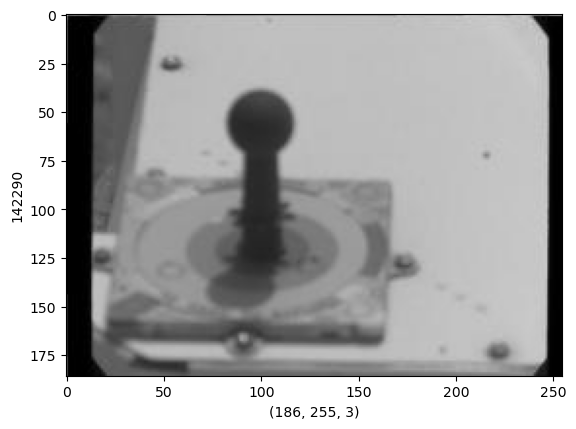

In [67]:
simple_vision(Main_Mars_Data["JPG"][2])

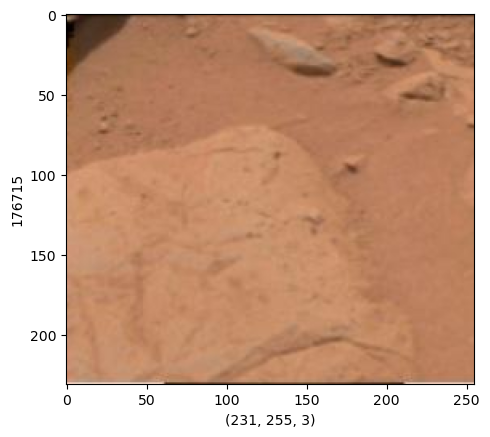

In [69]:
simple_vision(Main_Mars_Data["JPG"][4560])

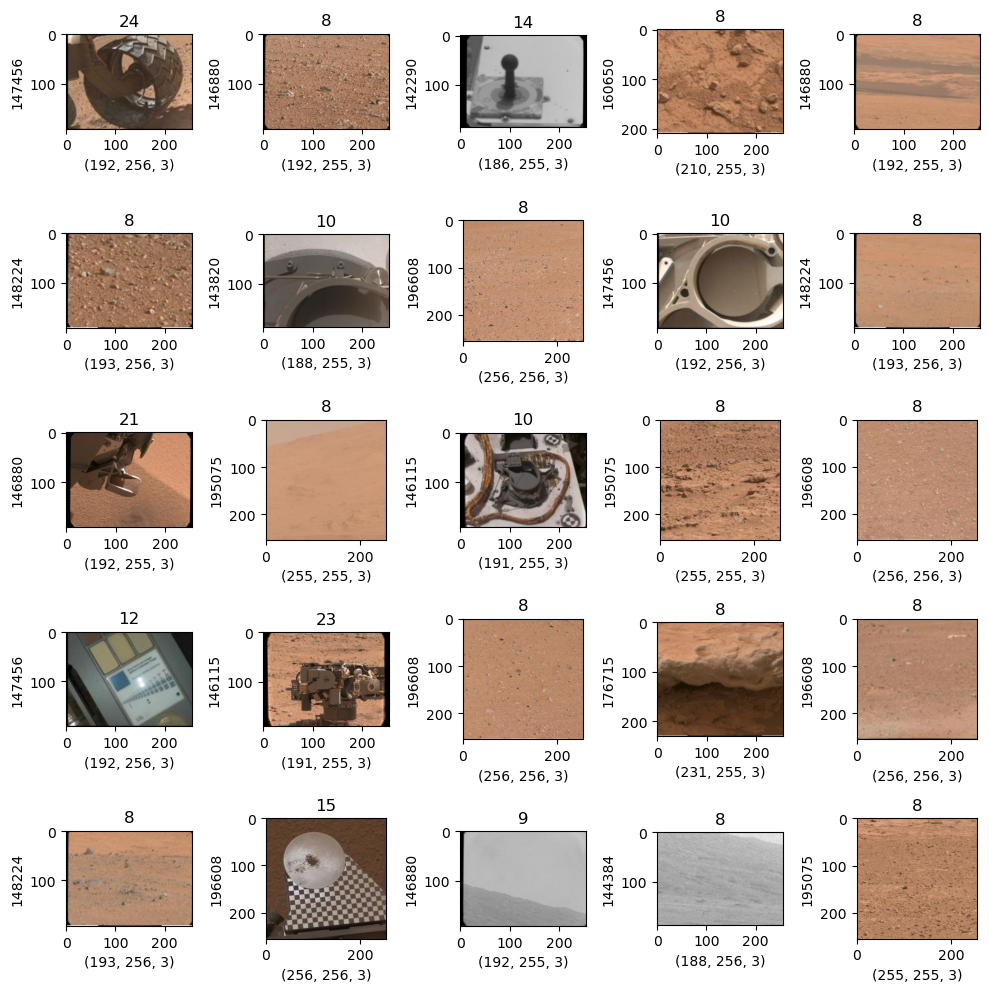

In [71]:
figure,axis = plt.subplots(5,5,figsize=(10,10))

for indexing,operation in enumerate(axis.flat):
    
    Picking_Image = Main_Mars_Data["JPG"][indexing]
    Reading_Image = cv2.cvtColor(cv2.imread(Picking_Image),cv2.COLOR_BGR2RGB)
    
    operation.set_xlabel(Reading_Image.shape)
    operation.set_ylabel(Reading_Image.size)
    operation.set_title(Main_Mars_Data["CATEGORY"][indexing])
    operation.imshow(Reading_Image)
    
plt.tight_layout()
plt.show()

#### THRESHOLD

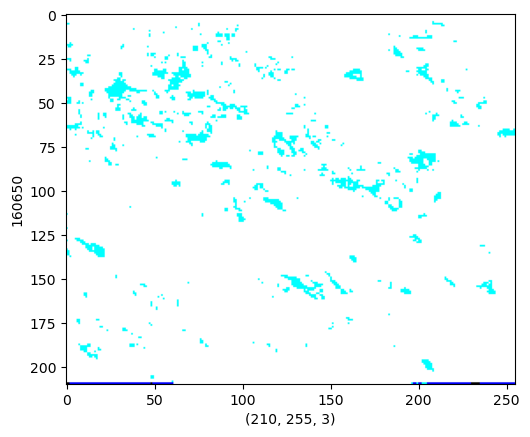

In [74]:
threshold_function(Main_Mars_Data["JPG"][3])

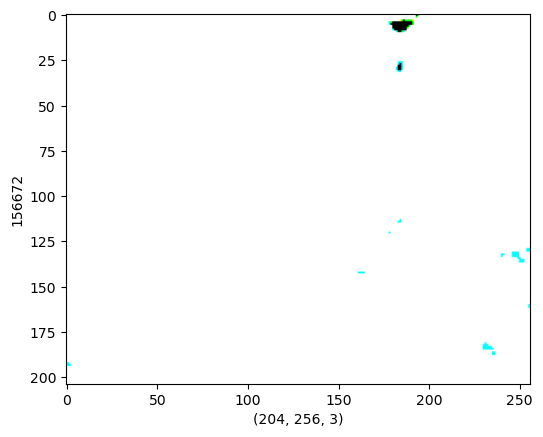

In [76]:
threshold_function(Main_Mars_Data["JPG"][44])

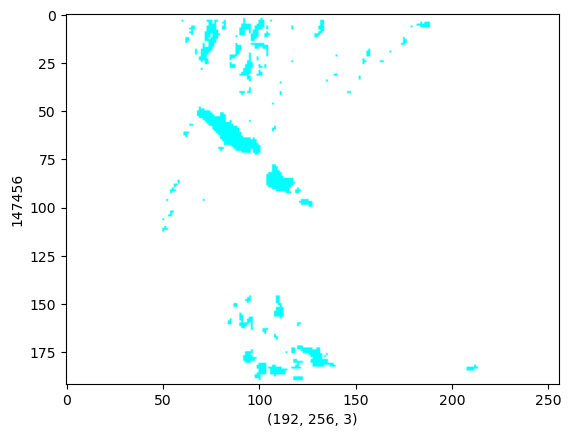

In [78]:
threshold_function(Main_Mars_Data["JPG"][400])

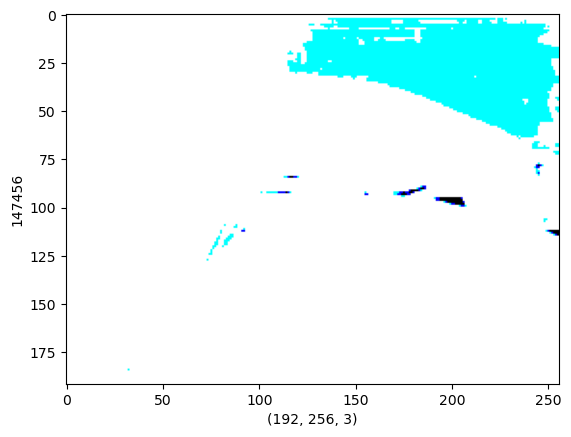

In [80]:
threshold_function(Main_Mars_Data["JPG"][827])

# PATH, LABEL, TRANSFORMATION FOR UNSUPERVISED

In [111]:
Another_Mars_Path = Path(r"D:\Intern\Mars New\Mars Surface and Curiosity Image\additional_images")

In [113]:
Another_JPG_List = list(Another_Mars_Path.glob(r"*.jpg"))

In [115]:
Another_JPG_Series = pd.Series(Another_JPG_List,name="JPG").astype(str)

In [117]:
print(Another_JPG_Series.head(-1))

0        D:\Intern\Mars New\Mars Surface and Curiosity ...
1        D:\Intern\Mars New\Mars Surface and Curiosity ...
2        D:\Intern\Mars New\Mars Surface and Curiosity ...
3        D:\Intern\Mars New\Mars Surface and Curiosity ...
4        D:\Intern\Mars New\Mars Surface and Curiosity ...
                               ...                        
32362    D:\Intern\Mars New\Mars Surface and Curiosity ...
32363    D:\Intern\Mars New\Mars Surface and Curiosity ...
32364    D:\Intern\Mars New\Mars Surface and Curiosity ...
32365    D:\Intern\Mars New\Mars Surface and Curiosity ...
32366    D:\Intern\Mars New\Mars Surface and Curiosity ...
Name: JPG, Length: 32367, dtype: object


In [119]:
Another_JPG_Series = Another_JPG_Series[0:2000]

In [121]:
print(Another_JPG_Series.head(-1))

0       D:\Intern\Mars New\Mars Surface and Curiosity ...
1       D:\Intern\Mars New\Mars Surface and Curiosity ...
2       D:\Intern\Mars New\Mars Surface and Curiosity ...
3       D:\Intern\Mars New\Mars Surface and Curiosity ...
4       D:\Intern\Mars New\Mars Surface and Curiosity ...
                              ...                        
1994    D:\Intern\Mars New\Mars Surface and Curiosity ...
1995    D:\Intern\Mars New\Mars Surface and Curiosity ...
1996    D:\Intern\Mars New\Mars Surface and Curiosity ...
1997    D:\Intern\Mars New\Mars Surface and Curiosity ...
1998    D:\Intern\Mars New\Mars Surface and Curiosity ...
Name: JPG, Length: 1999, dtype: object


In [123]:
Transformed_X = []

for X_image in Another_JPG_Series:
    
    One_Image = cv2.cvtColor(cv2.imread(X_image),cv2.COLOR_BGR2RGB)
    One_Image = cv2.resize(One_Image,(180,180))
    One_Image = One_Image / 255.0
    Transformed_X.append(One_Image)

In [125]:
X_AE_Train = np.array(Transformed_X)

In [127]:
print(X_AE_Train.shape)

(2000, 180, 180, 3)


# VISION FOR UNSUPERVISED PROCESS

In [130]:
print(X_AE_Train.shape)  # This will show the dimensions of X_AE_Train


(2000, 180, 180, 3)


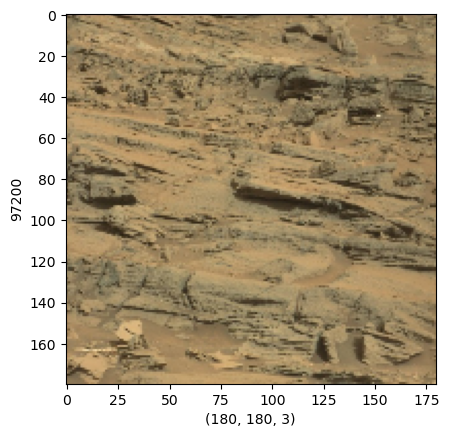

In [132]:
just_vision(X_AE_Train[20])

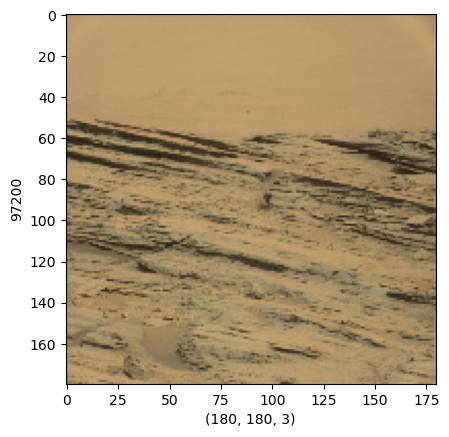

In [134]:
just_vision(X_AE_Train[1])

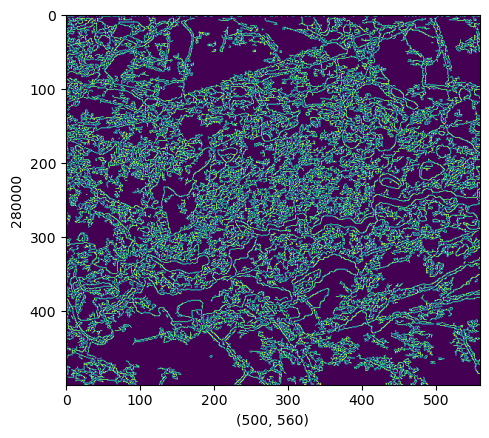

In [136]:
Reading_IMG = cv2.cvtColor(cv2.imread(Another_JPG_Series[0]),cv2.COLOR_BGR2RGB)

just_canny(Reading_IMG)

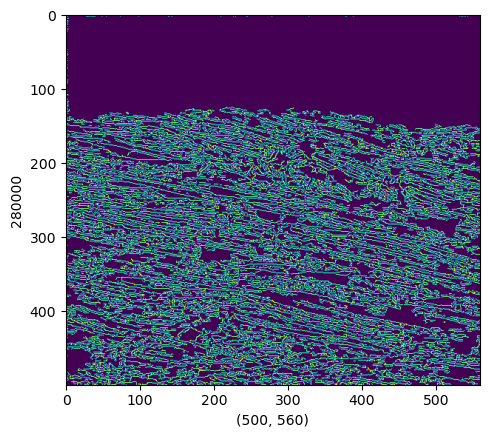

In [138]:
Reading_IMG = cv2.cvtColor(cv2.imread(Another_JPG_Series[2]),cv2.COLOR_BGR2RGB)

just_canny(Reading_IMG)

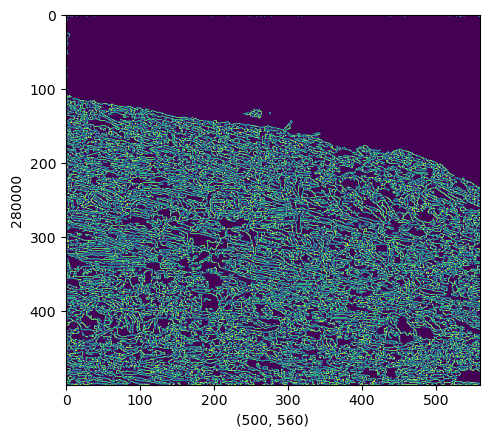

In [140]:
Reading_IMG = cv2.cvtColor(cv2.imread(Another_JPG_Series[6]),cv2.COLOR_BGR2RGB)

just_canny(Reading_IMG)

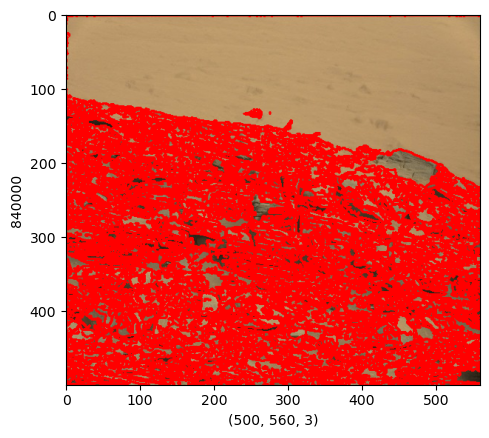

In [142]:
Reading_IMG = cv2.cvtColor(cv2.imread(Another_JPG_Series[6]),cv2.COLOR_BGR2RGB)

just_drawing_contour(Reading_IMG)

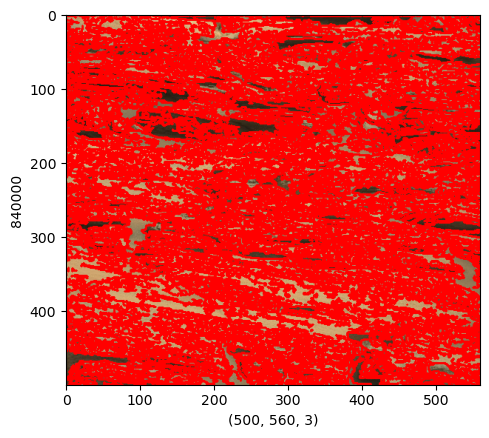

In [144]:
Reading_IMG = cv2.cvtColor(cv2.imread(Another_JPG_Series[16]),cv2.COLOR_BGR2RGB)

just_drawing_contour(Reading_IMG)

# IMAGE PROCESS FOR SUPERVISED

#### SPLITTING

In [148]:
X_Train,X_Test = train_test_split(Main_Mars_Data,train_size=0.9,random_state=42,shuffle=True)

In [150]:
print(X_Train.shape)
print(X_Test.shape)

(7917, 2)
(880, 2)


In [152]:
Validation_Set = X_Train[6000:7917]

In [154]:
X_Train = X_Train[0:2000]

In [156]:
Validation_Set = Validation_Set.reset_index()

In [158]:
print(X_Train.shape)
print(X_Test.shape)
print(Validation_Set.shape)

(2000, 2)
(880, 2)
(1917, 3)


In [160]:
print(X_Train.CATEGORY.value_counts())

CATEGORY
8     1140
9      112
24     108
10      75
23      72
21      71
14      55
3       43
17      42
7       41
15      37
12      28
0       26
13      23
16      23
20      20
5       17
2       16
6       13
19      12
4       11
11      10
1        4
18       1
Name: count, dtype: int64


In [162]:
Transformed_Y_Train = []
Transformed_Y_Train_Labels = []

for Y_image, Y_labels in zip(X_Train.JPG,X_Train.CATEGORY):
    
    Y_image = cv2.cvtColor(cv2.imread(Y_image),cv2.COLOR_BGR2RGB)
    Y_image = cv2.resize(Y_image,(180,180))
    Y_image = Y_image / 255.0
    Transformed_Y_Train.append(Y_image)
    Transformed_Y_Train_Labels.append(Y_labels)

In [164]:
Y_S_Train_Img = np.array(Transformed_Y_Train)
Y_S_Train_Labels = to_categorical(Transformed_Y_Train_Labels)

In [166]:
print(Y_S_Train_Img.shape)
print(Y_S_Train_Labels.shape)
print(X_AE_Train.shape)

(2000, 180, 180, 3)
(2000, 25)
(2000, 180, 180, 3)


# MODEL

#### CALLBACK

In [170]:
import tensorflow as tf

# Callback for early stopping
Early_Stopper = tf.keras.callbacks.EarlyStopping(
    monitor="loss",
    patience=3,
    mode="min"
)

# Callback for saving the best model weights based on validation accuracy
Checkpoint_Model = tf.keras.callbacks.ModelCheckpoint(
    filepath="./modelcheck.weights.h5",  # Corrected file extension
    monitor="val_accuracy",
    save_best_only=True,
    save_weights_only=True
)

# Callback for reducing learning rate on plateau
Reduce_Model = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="accuracy",
    factor=0.1,
    patience=7
)


#### STRUCTURE

In [173]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalMaxPooling2D, Dense, Dropout
from tensorflow.keras.models import Model

# Define the input layer
Input_Layer = tf.keras.Input(shape=(180, 180, 3))

# Define the convolutional layers and pooling layers for feature extraction
x = Conv2D(32, (3, 3), activation="relu", padding="same")(Input_Layer)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation="relu", padding="same")(x)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(128, (2, 2), activation="relu", padding="same")(x)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(256, (2, 2), activation="relu", padding="same")(x)
x = GlobalMaxPooling2D()(x)

# Fully connected layers after convolution
x = Dense(128, activation="relu")(x)
x = Dropout(0.5)(x)
class_prediction_layer = Dense(25, activation="softmax", name="CLASS_PREDICTION")(x)

# Define the encoder part for autoencoder
encoder = Dense(128, activation="relu")(Input_Layer)
encoder = Dense(64, activation="relu")(encoder)
encoder = Dense(32, activation="relu")(encoder)

# Define the decoder part for autoencoder
decoder = Dense(64, input_shape=[32], activation="relu")(encoder)
decoder = Dense(128, activation="relu")(decoder)
ae_output = Dense(3, activation="sigmoid", name="AE_OUTPUT")(decoder)

# Create the final model with multiple outputs
model = Model(inputs=Input_Layer, outputs=[class_prediction_layer, ae_output])

# Compile the model
model.compile(optimizer='adam', loss={'CLASS_PREDICTION': 'categorical_crossentropy', 'AE_OUTPUT': 'binary_crossentropy'}, metrics=['accuracy'])


In [175]:
Configure_Model = Model(Input_Layer,[class_prediction_layer,ae_output])

In [177]:
print(Configure_Model.summary())

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 180, 180,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 180, 180,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 90, 90,    │          0 │ conv2d[0][0]      │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 90, 90,    │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 45, 45,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 45, 45,    │     32,896 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 22, 22,    │          0 │ conv2d_2[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 180, 180,  │        512 │ input_layer[0][0] │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 22, 22,    │    131,328 │ max_pooling2d_2[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 180, 180,  │      8,256 │ dense_1[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_max_pooling… │ (None, 256)       │          0 │ conv2d_3[0][0]    │
│ (GlobalMaxPooling2… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 180, 180,  │      2,080 │ dense_2[0][0]     │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 128)       │     32,896 │ global_max_pooli… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 180, 180,  │      2,112 │ dense_3[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 128)       │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 180, 180,  │      8,320 │ dense_4[0][0]     │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ CLASS_PREDICTION    │ (None, 25)        │      3,225 │ dropout[0][0]     │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 241,404 (942.98 KB)

 Trainable params: 241,404 (942.98 KB)

 Non-trainable params: 0 (0.00 B)

None


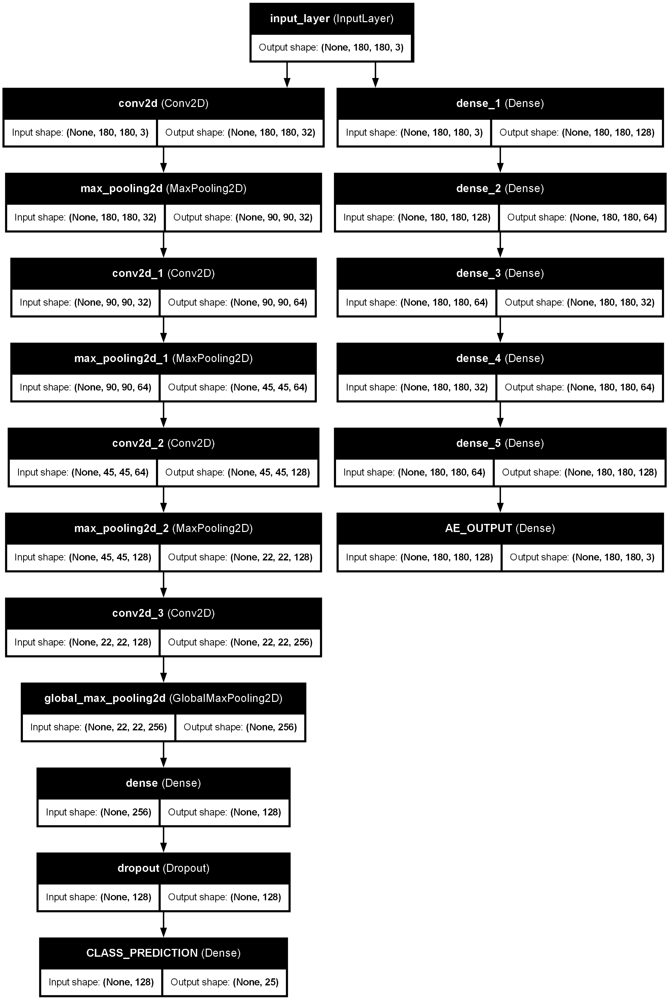

In [179]:
plot_model(Configure_Model, to_file='Conf.png', show_shapes=True, show_layer_names=True)

In [181]:
Configure_Model.compile(optimizer="adam",loss={"CLASS_PREDICTION":"categorical_crossentropy",
                                              "AE_OUTPUT":"binary_crossentropy"},metrics=["accuracy"])

In [191]:
# 🔹 Define Metrics for Both Outputs
Configure_Model.compile(
    optimizer="adam",
    loss={"CLASS_PREDICTION": "categorical_crossentropy", "AE_OUTPUT": "mse"},
    metrics={"CLASS_PREDICTION": ["accuracy"], "AE_OUTPUT": ["mse"]}  # Provide metrics for both outputs
)

# 🔹 Train the Model
Model_Configure_Total = Configure_Model.fit(
    Y_S_Train_Img,
    {"CLASS_PREDICTION": Y_S_Train_Labels, "AE_OUTPUT": X_AE_Train},  # Match outputs correctly
    epochs=50,
    batch_size=64,
    callbacks=[Early_Stopper, Checkpoint_Model, Reduce_Model]
)


Epoch 1/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 132s 4s/step - AE_OUTPUT_loss: 0.0184 - AE_OUTPUT_mse: 0.0184 - CLASS_PREDICTION_accuracy: 0.5035 - CLASS_PREDICTION_loss: 2.5204 - loss: 2.5386 - learning_rate: 0.0010
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 121s 4s/step - AE_OUTPUT_loss: 0.0135 - AE_OUTPUT_mse: 0.0135 - CLASS_PREDICTION_accuracy: 0.5732 - CLASS_PREDICTION_loss: 1.8884 - loss: 1.9025 - learning_rate: 0.0010
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 133s 4s/step - AE_OUTPUT_loss: 0.0131 - AE_OUTPUT_mse: 0.0131 - CLASS_PREDICTION_accuracy: 0.5857 - CLASS_PREDICTION_loss: 1.5919 - loss: 1.6068 - learning_rate: 0.0010
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 136s 4s/step - AE_OUTPUT_loss: 0.0136 - AE_OUTPUT_mse: 0.0136 - CLASS_PREDICTION_accuracy: 0.6348 - CLASS_PREDICTION_loss: 1.3522 - loss: 1.3661 - learning_rate: 0.0010
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 134s 4s/step - AE_OUTPUT_loss: 0.0134 - AE_OUTPUT_mse: 0.0134 - CLASS_PREDICTION_accuracy: 0.6740 - CLASS_PREDICTION_loss: 1.1609 - lo

#### CHECKING

In [193]:
plt.style.use("dark_background")

<Axes: >

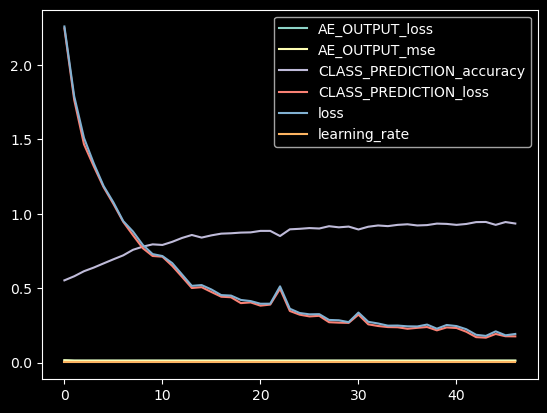

In [195]:
Grap_Data = pd.DataFrame(Model_Configure_Total.history)
Grap_Data.plot()

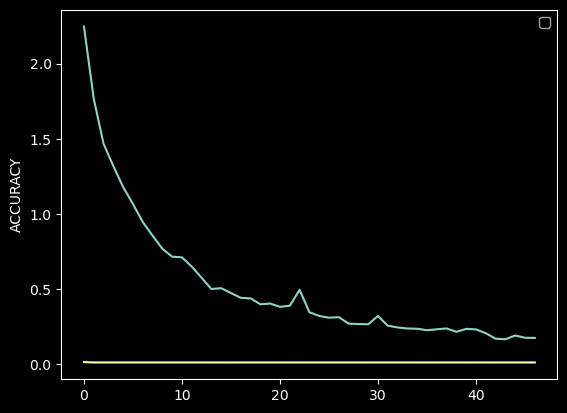

In [197]:
plt.plot(Model_Configure_Total.history["CLASS_PREDICTION_loss"])
plt.plot(Model_Configure_Total.history["AE_OUTPUT_loss"])
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

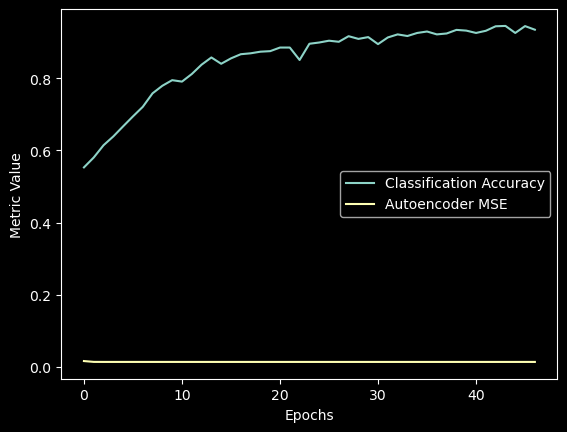

In [199]:
# Plotting accuracy for the classification output
plt.plot(Model_Configure_Total.history["CLASS_PREDICTION_accuracy"], label="Classification Accuracy")

# Plotting loss for the autoencoder output (or mean squared error, if available)
if "AE_OUTPUT_mse" in Model_Configure_Total.history:
    plt.plot(Model_Configure_Total.history["AE_OUTPUT_mse"], label="Autoencoder MSE")
elif "AE_OUTPUT_loss" in Model_Configure_Total.history:
    plt.plot(Model_Configure_Total.history["AE_OUTPUT_loss"], label="Autoencoder Loss")

# Add labels, legend, and display
plt.ylabel("Metric Value")
plt.xlabel("Epochs")
plt.legend()
plt.show()


In [201]:
print(Model_Configure_Total.history.keys())


dict_keys(['AE_OUTPUT_loss', 'AE_OUTPUT_mse', 'CLASS_PREDICTION_accuracy', 'CLASS_PREDICTION_loss', 'loss', 'learning_rate'])


#### BASIC PREDICTION

In [204]:
Test_Prediction = Configure_Model(Y_S_Train_Img[0:10])

In [206]:
print(type(Test_Prediction))

<class 'list'>


In [208]:
print(Test_Prediction[0])

tf.Tensor(
[[1.91061237e-13 1.14208924e-21 6.98402240e-18 3.26266791e-14
  1.03318445e-16 3.36019465e-21 2.31347652e-18 2.91726977e-15
  1.00000000e+00 2.90813595e-08 2.67326817e-14 1.62612723e-17
  1.33735508e-14 9.60488866e-22 4.79334853e-17 2.75555424e-15
  6.63201517e-19 1.03441779e-18 5.17937687e-21 2.06300995e-17
  2.36719398e-16 1.15806666e-14 9.70088067e-23 7.14475639e-20
  1.22630001e-13]
 [6.45534645e-18 9.28586930e-28 2.24107810e-23 5.84396123e-20
  3.78386511e-22 3.02958853e-27 1.05776102e-26 1.93806600e-21
  1.00000000e+00 1.31050948e-08 1.40923853e-20 1.73630242e-23
  3.99571068e-19 7.05577676e-29 3.12520589e-22 1.91572061e-21
  3.98376452e-26 4.31681944e-26 2.18935171e-27 1.42214960e-22
  5.07336668e-22 1.42928086e-20 1.14793745e-29 1.44289468e-27
  9.09367003e-19]
 [4.57835863e-13 1.02140355e-18 4.93409363e-14 3.61450625e-09
  1.26676100e-12 1.19543395e-14 1.06073352e-14 4.59989546e-11
  1.00000000e+00 1.37632350e-08 8.48983731e-12 1.14040831e-14
  1.13721803e-13 3.2343

In [210]:
# print(Test_Prediction[0].argmax(axis=-1)) # this is first class(label) prediction
print(Test_Prediction[0])

tf.Tensor(
[[1.91061237e-13 1.14208924e-21 6.98402240e-18 3.26266791e-14
  1.03318445e-16 3.36019465e-21 2.31347652e-18 2.91726977e-15
  1.00000000e+00 2.90813595e-08 2.67326817e-14 1.62612723e-17
  1.33735508e-14 9.60488866e-22 4.79334853e-17 2.75555424e-15
  6.63201517e-19 1.03441779e-18 5.17937687e-21 2.06300995e-17
  2.36719398e-16 1.15806666e-14 9.70088067e-23 7.14475639e-20
  1.22630001e-13]
 [6.45534645e-18 9.28586930e-28 2.24107810e-23 5.84396123e-20
  3.78386511e-22 3.02958853e-27 1.05776102e-26 1.93806600e-21
  1.00000000e+00 1.31050948e-08 1.40923853e-20 1.73630242e-23
  3.99571068e-19 7.05577676e-29 3.12520589e-22 1.91572061e-21
  3.98376452e-26 4.31681944e-26 2.18935171e-27 1.42214960e-22
  5.07336668e-22 1.42928086e-20 1.14793745e-29 1.44289468e-27
  9.09367003e-19]
 [4.57835863e-13 1.02140355e-18 4.93409363e-14 3.61450625e-09
  1.26676100e-12 1.19543395e-14 1.06073352e-14 4.59989546e-11
  1.00000000e+00 1.37632350e-08 8.48983731e-12 1.14040831e-14
  1.13721803e-13 3.2343

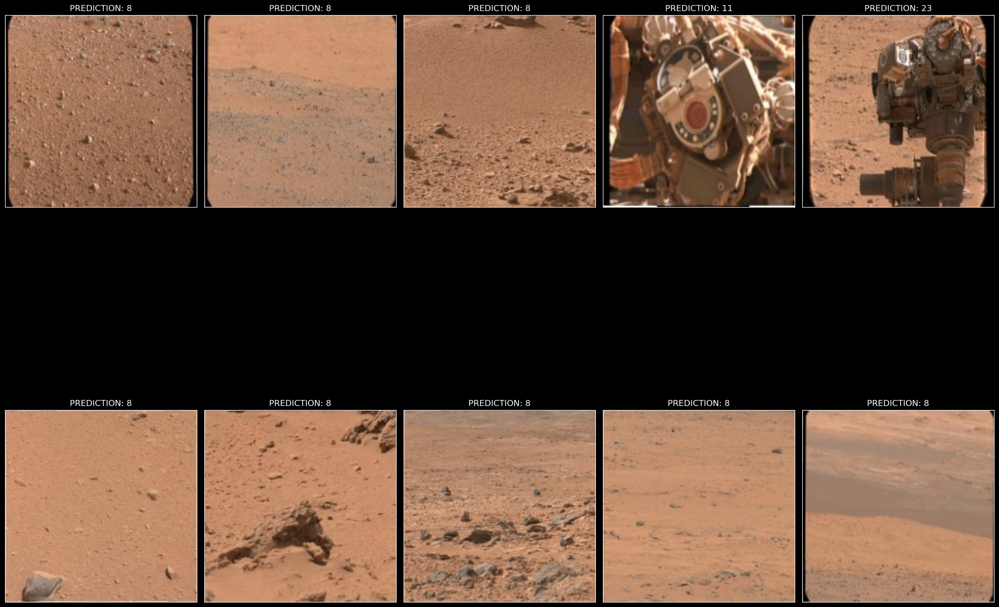

In [212]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming Transformed_Y_Train is an array of images and Test_Prediction is the model's output predictions
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 20), subplot_kw={'xticks': [], 'yticks': []})

# Flatten the axes array for easier iteration
for i, ax in enumerate(axes.flat):
    # Display the image
    ax.imshow(Transformed_Y_Train[i])
    
    # Get the predicted class using argmax
    prediction = np.argmax(Test_Prediction[0], axis=-1)[i]
    
    # Set the title with the predicted class
    ax.set_title(f"PREDICTION: {prediction}")

# Adjust the layout for better spacing
plt.tight_layout()
plt.show()


In [215]:
Transformed_Y_Test = []
Transformed_Y_Test_Labels = []

for Y_image, Y_labels in zip(X_Test.JPG,X_Test.CATEGORY):
    
    Y_image = cv2.cvtColor(cv2.imread(Y_image),cv2.COLOR_BGR2RGB)
    Y_image = cv2.resize(Y_image,(180,180))
    Y_image = Y_image / 255.0
    Transformed_Y_Test.append(Y_image)
    Transformed_Y_Test_Labels.append(Y_labels)

In [217]:
Y_S_Test_Img = np.array(Transformed_Y_Test)
Y_S_Test_Labels = to_categorical(Transformed_Y_Test_Labels)

In [219]:
Other_Test_Prediction = Configure_Model.predict(Y_S_Test_Img[0:10])

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


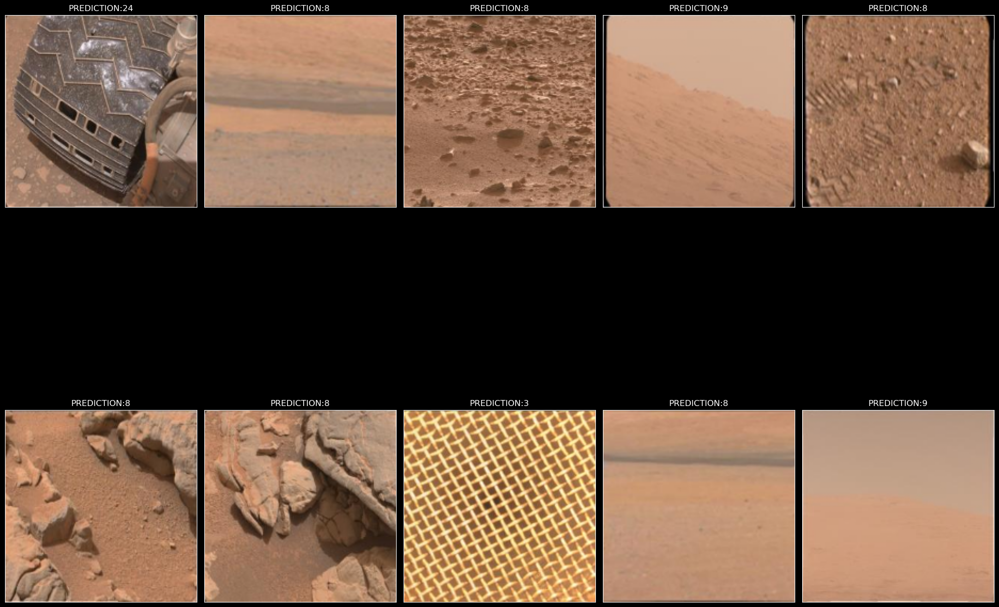

In [221]:
fig, axes = plt.subplots(nrows=2,
                         ncols=5,
                         figsize=(20, 20),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(Transformed_Y_Test[i])
    ax.set_title(f"PREDICTION:{Other_Test_Prediction[0].argmax(axis=-1)[i]}")
plt.tight_layout()
plt.show()

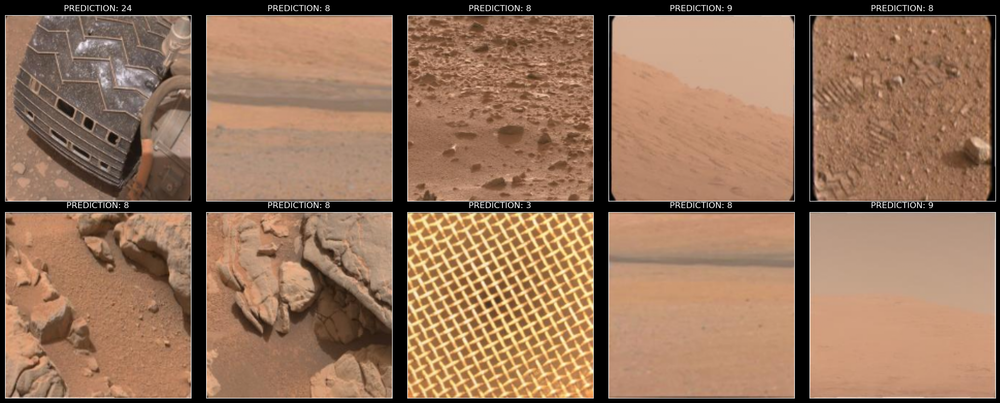

In [223]:
# Calculate the number of images to display
num_images = min(50, len(Transformed_Y_Test), len(Other_Test_Prediction[0]))

# Create a grid of subplots
rows = (num_images + 4) // 5  # Calculate the number of rows needed (5 images per row)
fig, axes = plt.subplots(nrows=rows, ncols=5, figsize=(20, rows * 4), subplot_kw={'xticks': [], 'yticks': []})

# Flatten the axes for easier indexing
axes = axes.flatten()

# Loop through the available images and predictions
for i in range(num_images):
    axes[i].imshow(Transformed_Y_Test[i])  # Display the image
    axes[i].set_title(f"PREDICTION: {Other_Test_Prediction[0].argmax(axis=-1)[i]}")  # Display the prediction

# Hide unused axes if the grid is larger than the number of images
for ax in axes[num_images:]:
    ax.axis('off')

plt.tight_layout()
plt.show()


selection output

In [10]:
import tkinter as tk
from tkinter import Button, Label

root = tk.Tk()
root.title("Test Window")

btn = Button(root, text="Click Me", font=("Arial", 12))
btn.pack()

label = Label(root, text="Hello!", font=("Arial", 14))
label.pack()

root.mainloop()


In [12]:
from tkinter import filedialog

file_path = filedialog.askopenfilename()
print(f"Selected File: {file_path}")


Selected File: D:/Intern/Mars New/Mars Surface and Curiosity Image/additional_images/121_0121ML0007580000103880E01_DXXX.jpg


In [18]:
# Model-ஐ native Keras format-ஆ save செய்ய
model.save("model.keras")
print("Model Saved Successfully as model.keras")

# .keras file-லிருந்து model-ஐ load செய்ய
from tensorflow.keras.models import load_model
model = load_model("model.keras")
print("Model Loaded Successfully from model.keras")


Model Saved Successfully as model.keras
Model Loaded Successfully from model.keras


C:\ProgramData\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 50 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [22]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import ModelCheckpoint

# Dummy training data
x_train = np.random.rand(1000, 20)  # 1000 samples, 20 features each
y_train = np.random.randint(2, size=(1000, 1))  # binary labels (0 or 1)
x_val = np.random.rand(200, 20)    # 200 validation samples
y_val = np.random.randint(2, size=(200, 1))

# Build a simple model
model = Sequential([
    Dense(64, activation='relu', input_shape=(20,)),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Define ModelCheckpoint callback to save best model
checkpoint_filepath = 'best_model.keras'
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    monitor='val_loss',
    mode='min',
    save_best_only=True,
    save_weights_only=False,
    verbose=1
)

# Training the model with the callback (this saves the best model)
history = model.fit(
    x_train, y_train,
    epochs=10,
    validation_data=(x_val, y_val),
    callbacks=[model_checkpoint_callback]
)

# Load the best saved model (resume training or inference)
model = load_model(checkpoint_filepath)
print("Resumed model loaded from checkpoint.")

# Optionally, resume training with additional epochs
history = model.fit(
    x_train, y_train,
    epochs=5,
    validation_data=(x_val, y_val)
)


Epoch 1/10


C:\ProgramData\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


24/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5513 - loss: 0.6928
Epoch 1: val_loss improved from inf to 0.68981, saving model to best_model.keras
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.5387 - loss: 0.6942 - val_accuracy: 0.5100 - val_loss: 0.6898
Epoch 2/10
18/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5035 - loss: 0.6969 
Epoch 2: val_loss did not improve from 0.68981
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5053 - loss: 0.6952 - val_accuracy: 0.5150 - val_loss: 0.6939
Epoch 3/10
17/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5328 - loss: 0.6908 
Epoch 3: val_loss did not improve from 0.68981
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5296 - loss: 0.6900 - val_accuracy: 0.5250 - val_loss: 0.6916
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5439 - loss: 0.6860
Epoch 4: val_loss did not improve from 0.68981
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5433 - loss: 0.6861 - val_accuracy: 0.5350 - val_los

In [24]:
from keras.models import load_model

model = load_model("mars_model.h5")  
print("Model Loaded Successfully!")


Model Loaded Successfully!


In [26]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
print("Model Compiled Successfully!")


Model Compiled Successfully!


In [1]:
from tensorflow.keras.models import load_model

# Checkpoint file-இல் இருந்து model-ஐ load செய்வது
model = load_model("best_model.keras")
print("Model loaded successfully from checkpoint.")

# (Optional) உங்களது training data-ஐ வைத்திருந்தால், training resume செய்ய:
# history = model.fit(x_train, y_train, epochs=5, validation_data=(x_val, y_val))


Model loaded successfully from checkpoint.


In [1]:
#  Alert Message 

In [1]:
import os
import numpy as np
import tkinter as tk
from tkinter import filedialog, messagebox
from keras.preprocessing import image
from keras.models import load_model
import cv2

# Load the trained model
model = load_model("mars_model.h5")
print("✅ Model Loaded Successfully!")

# Define threshold for valid classification
THRESHOLD = 0.7  # 70% confidence needed

# Dictionary mapping labels to meaningful messages
label_messages = {
   
    1: "APXS Calibration Target detected. Adjusting instruments!",
    2: "ChemCam Calibration Target detected. Ready for calibration!",
    3: "CheMin Inlet Open detected. Sample analysis in progress!",
    4: "Drill detected. Preparing for surface drilling!",
    5: "Drill Holes detected. Avoid re-drilling the same location!",
    6: "DRT Front detected. Dust removal tool in action!",
    7: "DRT Side detected. Tool operation confirmed!",
    8: "Ground detected.",
    9: "Horizon detected. Adjusting navigation system!",
    10: "Inlet detected. Sample processing ongoing!",
    11: "MAHLI detected. Camera system activated!",
    12: "MAHLI Calibration Target detected. Camera testing initiated!",
    13: "MastCam detected. Capturing high-resolution images!",
    14: "MastCam Calibration Target detected. Adjusting camera settings!",
    15: "Observation Tray detected. Sample analysis zone!",
    16: "Portion Box detected. Managing sample storage!",
    17: "Portion Tube detected. Sample transport enabled!",
    18: "Portion Tube Opening detected. Handling sample material!",
    19: "REMS UV Sensor detected. Monitoring UV radiation!",
    20: "Rover Rear Deck detected. Checking rear systems!",
    21: "Scoop detected. Collecting surface material!",
    22: "Sun detected. Optimizing solar energy absorption!",
    23: "Turret detected. Tool positioning in progress!",
    24: "Wheel detected. Caution: Check for obstacles before moving!",
    25: "❌ Non-Mars Image detected. This image is NOT from Mars!"
}

def show_message(message):
    root_msg = tk.Tk()
    root_msg.withdraw()  # Hide the main window
    messagebox.showinfo("Classification Result", message)
    root_msg.destroy()

def detect_rocks_in_ground(image_path):
    """
    Detect rock-like objects in the ground image using edge detection and contours.
    Draw bounding boxes on the image and show an alert based on detection.
    """
    img = cv2.imread(image_path)
    if img is None:
        print("Could not load image for rock detection.")
        return "Rock detection failed."
    
    # Resize for processing
    img = cv2.resize(img, (800, 800))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5,5), 0)
    edges = cv2.Canny(blur, 50, 150)
    kernel = np.ones((3,3), np.uint8)
    edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel, iterations=1)
    contours, _ = cv2.findContours(edges.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    found_rock = False
    # Draw polygonal outlines around contours with area > 1000
    for cnt in contours:
        if cv2.contourArea(cnt) > 1000:
            found_rock = True
            epsilon = 0.02 * cv2.arcLength(cnt, True)
            approx = cv2.approxPolyDP(cnt, epsilon, True)
            color = (np.random.randint(0,256), np.random.randint(0,256), np.random.randint(0,256))
            cv2.drawContours(img, [approx], -1, color, 2)
    
    # Show the processed image with bounding boxes
    cv2.imshow("Ground with Rocks Outlined", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    
    # Return alert message based on detection
    if found_rock:
        return "Rock detected! Change your path or rover parts may be damaged."
    else:
        return "Ground detected: This is safe ground, you can move further."

def predict_image(img_path):
    # Load and preprocess image for classification
    img = image.load_img(img_path, target_size=(180, 180))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0

    prediction = model.predict(img_array, verbose=0)
    if isinstance(prediction, list):
        prediction = prediction[0]
    if prediction.ndim > 1:
        prediction = prediction.flatten()

    predicted_class = np.argmax(prediction)
    max_prob = np.max(prediction)
    
    # If confidence is low, treat as non-Mars image
    if max_prob < THRESHOLD:
        return 25, max_prob, label_messages[25]
    
    # If predicted as ground (label 8), run rock detection routine
    if predicted_class == 8:
        rock_message = detect_rocks_in_ground(img_path)
        return predicted_class, max_prob, rock_message
    
    # For other labels, return corresponding message
    return predicted_class, max_prob, label_messages.get(predicted_class, "Unknown object detected!")

# Create a hidden Tkinter root for file dialog
root = tk.Tk()
root.withdraw()

while True:
    img_path = filedialog.askopenfilename(
        initialdir="D:\Intern\Mars New\Mars Surface and Curiosity Image\additional",
        title="Select Image",
        filetypes=[("Image files", "*.jpg *.jpeg *.png"), ("All files", "*.*")]
    )
    if not img_path:
        break
    if os.path.exists(img_path):
        predicted_class, max_prob, message = predict_image(img_path)
        print(f"Predicted Class: {predicted_class} (Confidence: {max_prob:.2f})")
        show_message(message)
    else:
        print("❌ Invalid path. Try again.")


<>:126: SyntaxWarning: invalid escape sequence '\I'
<>:126: SyntaxWarning: invalid escape sequence '\I'
C:\Users\dhana\AppData\Local\Temp\ipykernel_15116\3566306001.py:126: SyntaxWarning: invalid escape sequence '\I'
  initialdir="D:\Intern\Mars New\Mars Surface and Curiosity Image\additional",


✅ Model Loaded Successfully!
Predicted Class: 8 (Confidence: 1.00)
Predicted Class: 8 (Confidence: 1.00)


In [54]:
# user choose the label

In [9]:
import os
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing import image
from keras.models import load_model
import tkinter as tk
from tkinter import filedialog, simpledialog

# Load the trained model
model = load_model("mars_model.h5")
print("✅ Model Loaded Successfully!")

# Define threshold and labels
THRESHOLD = 0.7  # Not used for filtering here, but can be used to warn low confidence
labels = [
    "[0]apxs",
    "[1]apxs cal target",
    "[2]chemcam cal target", 
    "[3]chemin inlet open",
    "[4]drill",
    "[5]drill holes", 
    "[6]drt front",
    "[7]drt side", 
    "[8]ground",
    "[9]horizon",
    "[10]inlet", 
    "[11]mahli", 
    "[12]mahli cal target",
    "[13]mastcam",
    "[14]mastcam cal target",
    "[15]observation tray",
    "[16]portion box",
    "[17]portion tube",
    "[18]portion tube opening",
    "[19]rems uv sensor",
    "[20]rover rear deck", 
    "[21]scoop", 
    "[22]sun", 
    "[23]turret",
    "[24]wheel",
    "[25]non mars image"
]

def predict_label(img_path):
    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(180, 180))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0  # Normalize

    prediction = model.predict(img_array, verbose=0)
    # Flatten prediction if necessary
    if isinstance(prediction, list):
        prediction = prediction[0]
    if prediction.ndim > 1:
        prediction = prediction.flatten()
    
    predicted_class = np.argmax(prediction)
    max_prob = np.max(prediction)
    return predicted_class, max_prob

# Create Tkinter root (hidden)
root = tk.Tk()
root.withdraw()

# Ask user to select a folder containing images
folder_path = filedialog.askdirectory(title="Select Folder Containing Images")
if not folder_path:
    print("No folder selected. Exiting.")
    exit()

# Ask user for the desired label number
label_str = simpledialog.askstring("Input", "Enter label number:")
if label_str is None:
    print("No label number provided. Exiting.")
    exit()
try:
    desired_label = int(label_str)
except:
    print("Invalid label number. Exiting.")
    exit()

# Get list of image files in the folder
image_extensions = ('.jpg', '.jpeg', '.png')
image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(image_extensions)]

filtered_images = []
for file in image_files:
    full_path = os.path.join(folder_path, file)
    pred_label, confidence = predict_label(full_path)
    # Optionally, you could check confidence here if needed
    if pred_label == desired_label:
        filtered_images.append(full_path)

if not filtered_images:
    print("No images found with the label", desired_label)
    exit()

# Display the filtered images in a grid using matplotlib
num_images = len(filtered_images)
cols = 4
rows = (num_images + cols - 1) // cols

plt.figure(figsize=(15, 5 * rows))
for i, img_path in enumerate(filtered_images):
    img = image.load_img(img_path)
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(labels[desired_label])
    plt.axis("off")
plt.tight_layout()
plt.show()


✅ Model Loaded Successfully!
No images found with the label 22


<Figure size 1500x0 with 0 Axes>

In [11]:
# Wrong boundry box

In [15]:
import cv2
import numpy as np
import tkinter as tk
from tkinter import filedialog, messagebox

def detect_rocks_and_alert(image_path):
    # Read the image
    img = cv2.imread(image_path)
    if img is None:
        print("Failed to load image.")
        return

    # Resize for processing (adjust as needed)
    img = cv2.resize(img, (800, 800))
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Apply Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    # Use Canny edge detection
    edges = cv2.Canny(blurred, 50, 150)
    # Optional: Apply morphological closing to fill small gaps
    kernel = np.ones((3,3), np.uint8)
    edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel, iterations=1)
    
    # Find contours in the edged image
    contours, _ = cv2.findContours(edges.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    rock_detected = False
    # Loop over contours and draw bounding boxes for large enough contours
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area > 1000:  # Adjust threshold to filter out noise
            rock_detected = True
            x, y, w, h = cv2.boundingRect(cnt)
            # Draw bounding box in green
            cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
    
    # Display the processed image with bounding boxes
    cv2.imshow("Rock Detection", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    
    # Show alert message using Tkinter messagebox
    alert_message = ("Rock detected! Change your path or rover parts may be damaged." 
                     if rock_detected 
                     else "No rock found, continue for 10 meters.")
    root = tk.Tk()
    root.withdraw()  # Hide the main window
    messagebox.showinfo("Alert", alert_message)
    root.destroy()

# Main execution: Open a file dialog for the user to select an image
if __name__ == "__main__":
    root = tk.Tk()
    root.withdraw()  # Hide the main Tkinter window
    image_path = filedialog.askopenfilename(
        title="Select an Image",
        filetypes=[("Image files", "*.jpg *.jpeg *.png")]
    )
    if image_path:
        detect_rocks_and_alert(image_path)
    else:
        print("No image selected.")


In [1]:
import os
import numpy as np
import tkinter as tk
from tkinter import filedialog, messagebox
from keras.preprocessing import image
from keras.models import load_model
import cv2

# Load the trained model
model = load_model("mars_model.h5")
print("✅ Model Loaded Successfully!")

# Define threshold for valid classification
THRESHOLD = 0.7  # 70% confidence needed

# Dictionary mapping labels to meaningful messages
label_messages = {
   
    1: "APXS Calibration Target detected. Adjusting instruments!",
    2: "ChemCam Calibration Target detected. Ready for calibration!",
    3: "CheMin Inlet Open detected. Sample analysis in progress!",
    4: "Drill detected. Preparing for surface drilling!",
    5: "Drill Holes detected. Avoid re-drilling the same location!",
    6: "DRT Front detected. Dust removal tool in action!",
    7: "DRT Side detected. Tool operation confirmed!",
    8: "Ground detected.",
    9: "Horizon detected. Adjusting navigation system!",
    10: "Inlet detected. Sample processing ongoing!",
    11: "MAHLI detected. Camera system activated!",
    12: "MAHLI Calibration Target detected. Camera testing initiated!",
    13: "MastCam detected. Capturing high-resolution images!",
    14: "MastCam Calibration Target detected. Adjusting camera settings!",
    15: "Observation Tray detected. Sample analysis zone!",
    16: "Portion Box detected. Managing sample storage!",
    17: "Portion Tube detected. Sample transport enabled!",
    18: "Portion Tube Opening detected. Handling sample material!",
    19: "REMS UV Sensor detected. Monitoring UV radiation!",
    20: "Rover Rear Deck detected. Checking rear systems!",
    21: "Scoop detected. Collecting surface material!",
    22: "Sun detected. Optimizing solar energy absorption!",
    23: "Turret detected. Tool positioning in progress!",
    24: "Wheel detected. Caution: Check for obstacles before moving!",
    25: "❌ Non-Mars Image detected. This image is NOT from Mars!"
}

def show_message(message):
    root_msg = tk.Tk()
    root_msg.withdraw()  # Hide the main window
    messagebox.showinfo("Classification Result", message)
    root_msg.destroy()

def detect_rocks_in_ground(image_path):
    """
    Detect rock-like objects in the ground image using edge detection and contours.
    Draw bounding boxes on the image and show an alert based on detection.
    """
    img = cv2.imread(image_path)
    if img is None:
        print("Could not load image for rock detection.")
        return "Rock detection failed."
    
    # Resize for processing
    img = cv2.resize(img, (800, 800))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5,5), 0)
    edges = cv2.Canny(blur, 50, 150)
    kernel = np.ones((3,3), np.uint8)
    edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel, iterations=1)
    contours, _ = cv2.findContours(edges.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    found_rock = False
    # Draw bounding boxes around contours with area > 1000
    for cnt in contours:
        if cv2.contourArea(cnt) > 1000:
            found_rock = True
            x, y, w, h = cv2.boundingRect(cnt)  # Get bounding box coordinates
            color = (0, 255, 0)  # Green color for bounding box
            cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)  # Draw rectangle
    
    # Show the processed image with bounding boxes
    cv2.imshow("Ground with Rocks Outlined", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    
    # Return alert message based on detection
    if found_rock:
        return "Rock detected! Change your path or rover parts may be damaged."
    else:
        return "Ground detected: This is safe ground, you can move further."


def predict_image(img_path):
    # Load and preprocess image for classification
    img = image.load_img(img_path, target_size=(180, 180))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0

    prediction = model.predict(img_array, verbose=0)
    if isinstance(prediction, list):
        prediction = prediction[0]
    if prediction.ndim > 1:
        prediction = prediction.flatten()

    predicted_class = np.argmax(prediction)
    max_prob = np.max(prediction)
    
    # If confidence is low, treat as non-Mars image
    if max_prob < THRESHOLD:
        return 25, max_prob, label_messages[25]
    
    # If predicted as ground (label 8), run rock detection routine
    if predicted_class == 8:
        rock_message = detect_rocks_in_ground(img_path)
        return predicted_class, max_prob, rock_message
    
    # For other labels, return corresponding message
    return predicted_class, max_prob, label_messages.get(predicted_class, "Unknown object detected!")

# Create a hidden Tkinter root for file dialog
root = tk.Tk()
root.withdraw()

while True:
    img_path = filedialog.askopenfilename(
        initialdir="D:\Intern\Mars New\Mars Surface and Curiosity Image\additional",
        title="Select Image",
        filetypes=[("Image files", "*.jpg *.jpeg *.png"), ("All files", "*.*")]
    )
    if not img_path:
        break
    if os.path.exists(img_path):
        predicted_class, max_prob, message = predict_image(img_path)
        print(f"Predicted Class: {predicted_class} (Confidence: {max_prob:.2f})")
        show_message(message)
    else:
        print("❌ Invalid path. Try again.")


<>:126: SyntaxWarning: invalid escape sequence '\I'
<>:126: SyntaxWarning: invalid escape sequence '\I'
C:\Users\dhana\AppData\Local\Temp\ipykernel_3556\1589891390.py:126: SyntaxWarning: invalid escape sequence '\I'
  initialdir="D:\Intern\Mars New\Mars Surface and Curiosity Image\additional",


✅ Model Loaded Successfully!
Predicted Class: 8 (Confidence: 1.00)
Predicted Class: 23 (Confidence: 1.00)


In [52]:
 # Folder Selection

In [17]:
import os
import cv2
import numpy as np
import tkinter as tk
from tkinter import filedialog, messagebox
from keras.preprocessing import image
from keras.models import load_model

# Load the trained model and label names.
model = load_model("mars_model.h5")
labels = [
    "apxs", "apxs cal target", "chemcam cal target", "chemin inlet open",
    "drill", "drill holes", "drt front", "drt side", "ground", "horizon",
    "inlet", "mahli", "mahli cal target", "mastcam", "mastcam cal target",
    "observation tray", "portion box", "portion tube", "portion tube opening",
    "rems uv sensor", "rover rear deck", "scoop", "sun", "turret", "wheel",
    "non mars image"
]

def predict_image_file(img_file):
    try:
        img = cv2.imread(img_file)
        if img is None:
            print(f"Failed to load {img_file}")
            return
        img = cv2.resize(img, (180, 180))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array /= 255.0
        
        prediction = model.predict(img_array, verbose=0)
        if isinstance(prediction, list):
            prediction = prediction[0]
        prediction = prediction.flatten()
        predicted_class = np.argmax(prediction)
        max_prob = np.max(prediction)
        print(f"Predicted: {labels[predicted_class]} | Confidence: {max_prob:.2f}")
    except Exception as e:
        print(f"Error processing {img_file}: {e}")

folder_path = input("Enter folder path: ").strip().strip('"')

if not os.path.isdir(folder_path):
    print("Invalid folder path.")
else:
    # Enumerate images starting from 1
    for idx, fname in enumerate(os.listdir(folder_path), start=1):
        if fname.lower().endswith(('.png', '.jpg', '.jpeg')):
            file_path = os.path.join(folder_path, fname)
            print(f"{idx} - Processing image: {fname}")
            predict_image_file(file_path)


Enter folder path:  "D:\Intern\Mars New\Mars Surface and Curiosity Image\additional"


1 - Processing image: 0003ML0000000360100056E01_DRCL.JPG
Predicted: ground | Confidence: 0.91
2 - Processing image: 0003ML0000000370100057E01_DRCL.JPG
Predicted: ground | Confidence: 0.82
3 - Processing image: 0003ML0000000400100060E01_DRCL.JPG
Predicted: ground | Confidence: 1.00
4 - Processing image: 0003MR0000000150100007D01_DRCL.JPG
Predicted: mastcam cal target | Confidence: 1.00
5 - Processing image: 0014ML0000160000100208E01_DRCL.JPG
Predicted: chemcam cal target | Confidence: 0.86
6 - Processing image: 0014ML0000170000100212E01_DRCL.JPG
Predicted: inlet | Confidence: 0.96
7 - Processing image: 0014ML0000190000100210I01_DRCL.JPG
Predicted: inlet | Confidence: 0.71
8 - Processing image: 0014ML0000200000100211I01_DRCL.JPG
Predicted: inlet | Confidence: 1.00
9 - Processing image: 0025ML0001270090100816E01_DRCL.JPG
Predicted: inlet | Confidence: 0.73
10 - Processing image: 0025ML0001270100100817E01_DRCL.JPG
Predicted: rover rear deck | Confidence: 0.82
11 - Processing image: 0032ML0

In [19]:
model.summary()


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 180, 180,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 180, 180,  │        896 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 90, 90,    │          0 │ conv2d_4[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 90, 90,    │     18,496 │ max_pooling2d_3[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 45, 45,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 45, 45,    │     32,896 │ max_pooling2d_4[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 22, 22,    │          0 │ conv2d_6[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, 180, 180,  │        512 │ input_layer_1[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 22, 22,    │    131,328 │ max_pooling2d_5[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 180, 180,  │      8,256 │ dense_7[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_max_pooling… │ (None, 256)       │          0 │ conv2d_7[0][0]    │
│ (GlobalMaxPooling2… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_9 (Dense)     │ (None, 180, 180,  │      2,080 │ dense_8[0][0]     │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 128)       │     32,896 │ global_max_pooli… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_10 (Dense)    │ (None, 180, 180,  │      2,112 │ dense_9[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 128)       │          0 │ dense_6[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_11 (Dense)    │ (None, 180, 180,  │      8,320 │ dense_10[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ CLASS_PREDICTION    │ (None, 25)        │      3,225 │ dropout_1[0][0]   │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 241,406 (943.00 KB)

 Trainable params: 241,404 (942.98 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [1]:
import os
import numpy as np
import cv2
from keras.preprocessing import image
from keras.models import load_model
import tkinter as tk
from tkinter import filedialog

# Load the trained model
model = load_model("mars_model.h5")
print("✅ Model Loaded Successfully!")

# Define threshold and labels
THRESHOLD = 0.7  # 70% confidence threshold
labels = [
    "apxs", "apxs cal target", "chemcam cal target", "chemin inlet open",
    "drill", "drill holes", "drt front", "drt side", "ground", "horizon",
    "inlet", "mahli", "mahli cal target", "mastcam", "mastcam cal target",
    "observation tray", "portion box", "portion tube", "portion tube opening",
    "rems uv sensor", "rover rear deck", "scoop", "sun", "turret", "wheel",
    "non mars image"
]

def predict_frame(frame):
    # Preprocess the frame for the model
    img = cv2.resize(frame, (180, 180))  # Resize to model's input size
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0  # Normalize

    prediction = model.predict(img_array, verbose=0)
    # Flatten prediction to 1D array if needed
    if isinstance(prediction, list):
        prediction = prediction[0]
    if prediction.ndim > 1:
        prediction = prediction.flatten()
    
    predicted_class = np.argmax(prediction)
    max_prob = np.max(prediction)
    return predicted_class, max_prob

# Use tkinter to open a folder selection dialog
root = tk.Tk()
root.withdraw()
folder_path = filedialog.askdirectory(title="Select Folder Containing Video Files")
if not folder_path:
    print("No folder selected. Exiting.")
    exit()

# Look for video files in the selected folder
video_extensions = ('.mp4', '.avi', '.mov', '.mkv')
video_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path)
               if f.lower().endswith(video_extensions)]

if not video_files:
    print("No video files found in the selected folder.")
    exit()

# For simplicity, process the first video file found
video_path = video_files[0]
print("Processing video:", video_path)

cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    print("Error: Cannot open video.")
    exit()

while True:
    ret, frame = cap.read()
    if not ret:
        break  # End of video
    
    # Predict on the current frame
    predicted_class, max_prob = predict_frame(frame)
    label_text = f"{labels[predicted_class]} ({max_prob:.2f})"
    if max_prob < THRESHOLD:
        label_text = "Invalid Mars image"

    # Display prediction on the frame
    cv2.putText(frame, label_text, (30, 50),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
    cv2.imshow("Video Classification", frame)

    # Press 'q' to quit
    if cv2.waitKey(30) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()


✅ Model Loaded Successfully!
Processing video: D:/Intern/Mars New/Mars Surface and Curiosity Image/video\ground.mp4


In [25]:
from tensorflow.keras.models import load_model

model = load_model("mars_model.h5")  # Trained model load pannura
print("Model Loaded Successfully!")


Model Loaded Successfully!
